# Tutorial for Visium HD CRC dataset
Need additional packages: scanpy seaborn 

### Load the packages

In [ ]:
import os
import time
import scanpy as sc
import pandas as pd
import numpy as np
import anndata as ad
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

from Harmonics import *

import warnings
warnings.filterwarnings("ignore")

sc.settings.verbosity = 0
sc.settings.set_figure_params(dpi=50, dpi_save=500)

from matplotlib import rcParams
rcParams["figure.dpi"] = 50
rcParams["savefig.dpi"] = 500
rcParams['pdf.fonttype'] = 42
rcParams['svg.fonttype'] = 'none'
rcParams['ps.fonttype'] = 42
rcParams['font.family'] = 'Arial'
# rcParams['agg.path.chunksize'] = 5000
rcParams['savefig.transparent'] = True

### Specify the data and save path

In [ ]:
data_dir = '../../../Data/Spatial/Transcriptomics/VisiumHD_CRC_Oliveira2024/processed/'
save_dir = f'../../results/VisiumHD_CRC_Oliveira2024/Harmonics/'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

Define the function to change p values to corresponding star representation, used to show the results of additional tests implemented in Harmonics.

In [3]:
def p2stars(p):
    if p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    else:
        return ''

### Load dataset
We only use bins that are predicted as singlet.

In [140]:
slice_name_list = ['P1CRC', 'P2CRC', 'P5CRC']
adata_list = []
for slice_name in slice_name_list:
    adata = ad.read_h5ad(data_dir+f'{slice_name}_singlet.h5ad')
    adata = adata[adata.obs['DeconvolutionClass']=='singlet', :].copy()
    adata_list.append(adata)

### Run model

Instantiate Harmonics

In [ ]:
model = Harmonics_Model(adata_list,  # the list of AnnData objects  
                        slice_name_list,  # the list of slice names
                        concat_label='slice_name',  # the label in .obs to indicate different slices
                        seed=1234,  # default
                        parallel=True,  # default 
                        verbose=True,  # default
                        )

Dataset comprises 3 slices, 810099 cells/spots in total.


Preprocess the data (Generating the connection graph and calculating neighborhood cell type destribution for cells)

In [ ]:
model.preprocess(ct_key='DeconvolutionLabel1',  # the label in .obs to indicate cell types
                 spatial_key='spatial',  # default
                 method='joint',  # default
                 n_step=3,  # default
                 n_neighbors=20,  # default
                 cut_percentage=99,  # default
                 )

Generating Delaunay neighbor graph...


100%|██████████| 3/3 [00:12<00:00,  4.27s/it]


All done!

Performing graph completion...


100%|██████████| 3/3 [01:07<00:00, 22.50s/it]


All done!

The cell types of interest are:
Adipocyte
CAF
CD4 T cell
CD8 T cell
Endothelial
Enteric Glial
Enterocyte
Epithelial
Fibroblast
Goblet
Lymphatic Endothelial
Macrophage
Mast
Mature B
Memory B
Myofibroblast
NK
Neuroendocrine
Neutrophil
Pericytes
Plasma
Proliferating Fibroblast
Proliferating Immune II
Proliferating Macrophages
SM Stress Response
Smooth Muscle
Tuft
Tumor I
Tumor II
Tumor III
Tumor IV
Tumor V
Unknown III (SM)
Vascular Fibroblast
cDC I
mRegDC
pDC
vSM

Generating one-hot matrix...


100%|██████████| 3/3 [00:01<00:00,  2.76it/s]


All done!

Dataset comprises 38 cell types.

Calculating cell type distribution for microenvironments...
Microenvironments comprise 38.75 cells/spots on average. 
Minimum: 20, Maximum: 84



Perform overclustered initialization on the cell type distributions of cell neighborhoods. Resulting in *Qmax* niches. The distributions of niches are also computed. We start from 30 niches on this dataset since using 20 cannot find the proper solution.

In [7]:
model.initialize_clusters(dim_reduction=True,  # default
                          explained_var=None,  # default
                          n_components=None,  # default
                          n_components_max=100,  # default
                          standardize=True,  # default
                          method='kmeans',  # default 
                          Qmax=30,  # default  
                          )

Performing dimension reduction...
Returning 38 principal components.

Initializing niches...
30 initial niches defined.



Perform hierarchical distribution matching to reduce the niche number to no more than *Qmin*. This step results in niche assignment under a sequence of different niche numbers (usually from *Qmax* to *Qmin*).

In [ ]:
model.hier_dist_match(assign_metric='jsd',  # default
                      weighted_merge=True,  # default
                      max_iters=100,  # default 
                      tol=1e-4,  # default 
                      test_kmeans=False,  # default
                      Qmin=2,  # default
                      )

Starting from 30 cell niches...

Assigning cells to cell niche...
Current state: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]


 65%|██████▌   | 65/100 [01:31<00:49,  1.41s/it]

Converge at iteration 66.
30 cell niches left.
Merging cell niche 2 and cell niche 12...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]



  9%|▉         | 9/100 [00:13<02:19,  1.53s/it]

Converge at iteration 10.
29 cell niches left.
Merging cell niche 2 and cell niche 28...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29]



 17%|█▋        | 17/100 [00:23<01:56,  1.40s/it]

Converge at iteration 18.
28 cell niches left.
Merging cell niche 2 and cell niche 15...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29]



 13%|█▎        | 13/100 [00:17<02:00,  1.38s/it]

Converge at iteration 14.
27 cell niches left.
Merging cell niche 20 and cell niche 2...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29]



 23%|██▎       | 23/100 [00:30<01:41,  1.32s/it]

Converge at iteration 24.
26 cell niches left.
Merging cell niche 20 and cell niche 27...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 29]



 11%|█         | 11/100 [00:15<02:06,  1.42s/it]

Converge at iteration 12.
25 cell niches left.
Merging cell niche 26 and cell niche 20...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 29]



 36%|███▌      | 36/100 [00:48<01:26,  1.36s/it]

Converge at iteration 37.
24 cell niches left.
Merging cell niche 6 and cell niche 26...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 16, 17, 18, 19, 21, 22, 23, 24, 25, 29]



 23%|██▎       | 23/100 [00:28<01:35,  1.24s/it]

Converge at iteration 24.
23 cell niches left.
Merging cell niche 6 and cell niche 14...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 16, 17, 18, 19, 21, 22, 23, 24, 25, 29]



 25%|██▌       | 25/100 [00:30<01:30,  1.21s/it]

Converge at iteration 26.
22 cell niches left.
Merging cell niche 6 and cell niche 24...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 16, 17, 18, 19, 21, 22, 23, 25, 29]



 19%|█▉        | 19/100 [00:23<01:39,  1.23s/it]

Converge at iteration 20.
21 cell niches left.
Merging cell niche 25 and cell niche 6...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 3, 4, 5, 7, 8, 9, 10, 11, 13, 16, 17, 18, 19, 21, 22, 23, 25, 29]



 25%|██▌       | 25/100 [00:30<01:30,  1.21s/it]

Converge at iteration 26.
20 cell niches left.
Merging cell niche 25 and cell niche 22...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 3, 4, 5, 7, 8, 9, 10, 11, 13, 16, 17, 18, 19, 21, 23, 25, 29]



 23%|██▎       | 23/100 [00:27<01:32,  1.20s/it]

Converge at iteration 24.
19 cell niches left.
Merging cell niche 19 and cell niche 25...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 3, 4, 5, 7, 8, 9, 10, 11, 13, 16, 17, 18, 19, 21, 23, 29]



 20%|██        | 20/100 [00:22<01:31,  1.15s/it]

Distribution of cell niches (centers) converge at iteration 21.
18 cell niches left.
Merging cell niche 23 and cell niche 19...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 3, 4, 5, 7, 8, 9, 10, 11, 13, 16, 17, 18, 21, 23, 29]



 21%|██        | 21/100 [00:24<01:32,  1.17s/it]

Converge at iteration 22.
17 cell niches left.


Merging cell niche 11 and cell niche 23...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 3, 4, 5, 7, 8, 9, 10, 11, 13, 16, 17, 18, 21, 29]


 13%|█▎        | 13/100 [00:14<01:36,  1.11s/it]

Converge at iteration 14.
16 cell niches left.
Merging cell niche 29 and cell niche 11...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 3, 4, 5, 7, 8, 9, 10, 13, 16, 17, 18, 21, 29]



 11%|█         | 11/100 [00:14<01:53,  1.27s/it]

Converge at iteration 12.
15 cell niches left.
Merging cell niche 10 and cell niche 29...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 3, 4, 5, 7, 8, 9, 10, 13, 16, 17, 18, 21]



  6%|▌         | 6/100 [00:06<01:45,  1.12s/it]

Distribution of cell niches (centers) converge at iteration 7.
14 cell niches left.
Merging cell niche 17 and cell niche 10...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 3, 4, 5, 7, 8, 9, 13, 16, 17, 18, 21]



 19%|█▉        | 19/100 [00:18<01:20,  1.00it/s]

Distribution of cell niches (centers) converge at iteration 20.
13 cell niches left.
Merging cell niche 13 and cell niche 21...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 3, 4, 5, 7, 8, 9, 13, 16, 17, 18]



 10%|█         | 10/100 [00:10<01:31,  1.01s/it]

Distribution of cell niches (centers) converge at iteration 11.
12 cell niches left.
Merging cell niche 17 and cell niche 7...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 3, 4, 5, 8, 9, 13, 16, 17, 18]



  5%|▌         | 5/100 [00:05<01:41,  1.06s/it]

Distribution of cell niches (centers) converge at iteration 6.
11 cell niches left.
Merging cell niche 16 and cell niche 3...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 4, 5, 8, 9, 13, 16, 17, 18]



  6%|▌         | 6/100 [00:06<01:34,  1.01s/it]

Distribution of cell niches (centers) converge at iteration 7.
10 cell niches left.
Merging cell niche 17 and cell niche 8...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 4, 5, 9, 13, 16, 17, 18]



 11%|█         | 11/100 [00:10<01:22,  1.08it/s]

Distribution of cell niches (centers) converge at iteration 12.
9 cell niches left.
Merging cell niche 18 and cell niche 17...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 4, 5, 9, 13, 16, 18]



  6%|▌         | 6/100 [00:05<01:28,  1.06it/s]

Distribution of cell niches (centers) converge at iteration 7.
8 cell niches left.
Merging cell niche 9 and cell niche 13...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 4, 5, 9, 16, 18]



  3%|▎         | 3/100 [00:03<01:40,  1.03s/it]

Distribution of cell niches (centers) converge at iteration 4.
7 cell niches left.
Merging cell niche 0 and cell niche 5...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 4, 9, 16, 18]



  1%|          | 1/100 [00:01<02:25,  1.47s/it]


Distribution of cell niches (centers) converge at iteration 2.
6 cell niches left.
Merging cell niche 16 and cell niche 9...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 4, 16, 18]


  2%|▏         | 2/100 [00:02<01:47,  1.10s/it]

Distribution of cell niches (centers) converge at iteration 3.
5 cell niches left.
Merging cell niche 16 and cell niche 1...
Done!

Assigning cells to cell niche...
Current state: [0, 4, 16, 18]



  2%|▏         | 2/100 [00:02<01:50,  1.12s/it]

Distribution of cell niches (centers) converge at iteration 3.
4 cell niches left.
Merging cell niche 16 and cell niche 4...
Done!

Assigning cells to cell niche...
Current state: [0, 16, 18]



  1%|          | 1/100 [00:01<02:12,  1.34s/it]

Distribution of cell niches (centers) converge at iteration 2.
3 cell niches left.
Merging cell niche 16 and cell niche 0...


Done!

Assigning cells to cell niche...
Current state: [16, 18]


  2%|▏         | 2/100 [00:02<01:38,  1.00s/it]

Distribution of cell niches (centers) converge at iteration 3.
2 cell niches left.
Niche count no more than 2.

Finished!



Automatically define the most appropriate number of cell niches based on minJSD score. The results are saved in .obs[niche_key]

Automatically selecting best solution...
Recommended number of niches are [18]
Selecting 18 niches as the best solution.


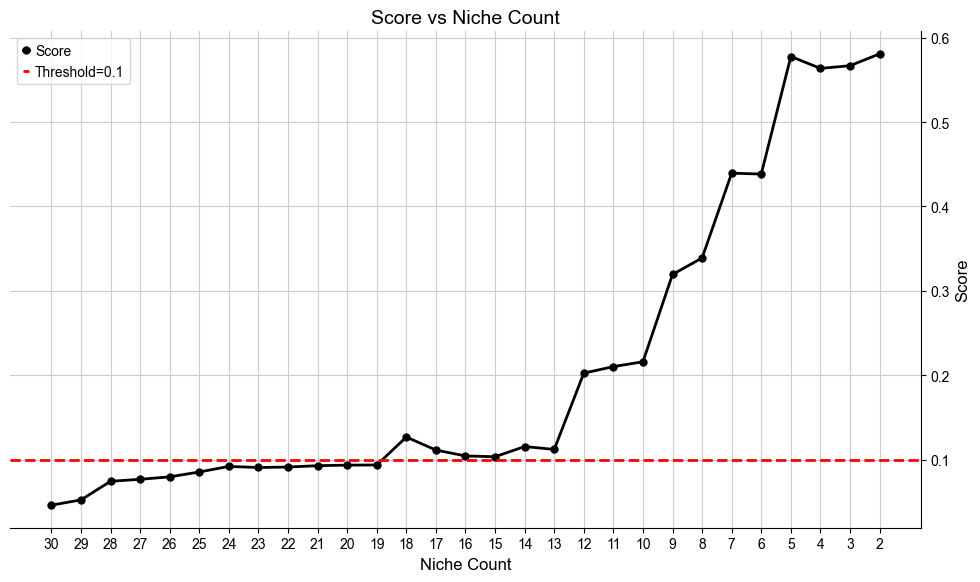

Done!



In [9]:
adata_list, adata_concat = model.select_solution(n_niche=None, 
                                                 niche_key='niche_label',  # default 
                                                 auto=True, 
                                                 metric='jsd',  # default
                                                 threshold=0.1,  # default
                                                 return_adata=True,  # default
                                                 plot=True,  # default
                                                 save=False,  # default
                                                 fig_size=(10, 6),  # default
                                                 save_dir=save_dir, 
                                                 file_name=f'score_vs_nichecount_basic.pdf',
                                                 )

Save and reload the results, and normalize the data for downstream analysis

In [ ]:
adata_concat.write_h5ad(save_dir + f'Harmonics_result_0.h5ad')

In [141]:
adata_concat = ad.read_h5ad(save_dir + f'Harmonics_result_0.h5ad')

for i, slice_name in enumerate(slice_name_list):
    adata = adata_concat[adata_concat.obs['slice_name'] == slice_name, :].copy()

    mt_mask = adata.var_names.str.startswith('MT-')
    adata = adata[:, ~mt_mask].copy()
    # sc.pp.filter_genes(adata, min_cells=100)
    print(f'{adata.shape[1]} genes left for {slice_name_list[i]}.')
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)

    # sc.pp.highly_variable_genes(adata, n_top_genes=3000, flavor='seurat_v3')
    # adata = adata[:, adata.var['highly_variable']].copy()

    adata_list[i] = adata

adata_concat_new = adata_concat.copy()
adata_concat_new

18074 genes left for P1CRC.
18074 genes left for P2CRC.
18074 genes left for P5CRC.


AnnData object with n_obs × n_vars = 810099 × 18085
    obs: 'tissue', 'X', 'Y', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'Periphery', 'UnsupervisedL1', 'UnsupervisedL2', 'MacrophageSubtype', 'GobletSubcluster', 'slice_name', 'celltype_idx', 'n_neighbors', 'niche_label'
    uns: 'ct2idx', 'idx2ct', 'niche_cell_count', 'niche_dist', 'niche_label_summary'
    obsm: 'micro_dist', 'onehot', 'spatial'

### Plot the results

In [142]:
ct_colors = ['#ffff00', '#1ce6ff', '#ff34ff', '#ff4a46', '#008941', '#006fa6', '#a30059', '#ffdbe5', '#7a4900', '#0000a6', 
          '#63ffac', '#b79762', '#004d43', '#8fb0ff', '#997d87', '#5a0007', '#809693', '#6a3a4c', '#1b4400', '#4fc601', 
          '#3b5dff', '#4a3b53', '#ff2f80', '#61615a', '#ba0900', '#6b7900', '#00c2a0', '#ffaa92', '#ff90c9', '#b903aa', 
          '#d16100', '#ddefff', '#000035', '#7b4f4b', '#a1c299', '#300018', '#0aa6d8', '#013349']
celltypes = ['Adipocyte', 'CAF', 'CD4 T cell', 'CD8 T cell', 'Endothelial', 'Enteric Glial', 'Enterocyte', 'Epithelial',
             'Fibroblast', 'Goblet', 'Lymphatic Endothelial', 'Macrophage', 'Mast', 'Mature B', 'Memory B', 'Myofibroblast',
             'NK', 'Neuroendocrine', 'Neutrophil', 'Pericytes', 'Plasma', 'Proliferating Fibroblast', 'Proliferating Immune II',
             'Proliferating Macrophages', 'SM Stress Response', 'Smooth Muscle', 'Tuft', 'Tumor I', 'Tumor II', 'Tumor III',
             'Tumor IV', 'Tumor V', 'Unknown III (SM)', 'Vascular Fibroblast', 'cDC I', 'mRegDC', 'pDC', 'vSM']
ct_color_dict = {ct: color for ct, color in zip(celltypes, ct_colors)}

niches = adata_concat_new.uns['niche_label_summary']
niche_colors = ['#1f77b4', '#ff7f0e', '#279e68', '#d62728', '#aa40fc', '#8c564b', '#e377c2', '#b5bd61', '#17becf', '#aec7e8',
                '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5', '#c49c94', '#f7b6d2', '#dbdb8d', '#9edae5']
niche_color_dict = {ct: color for ct, color in zip(niches, niche_colors)}

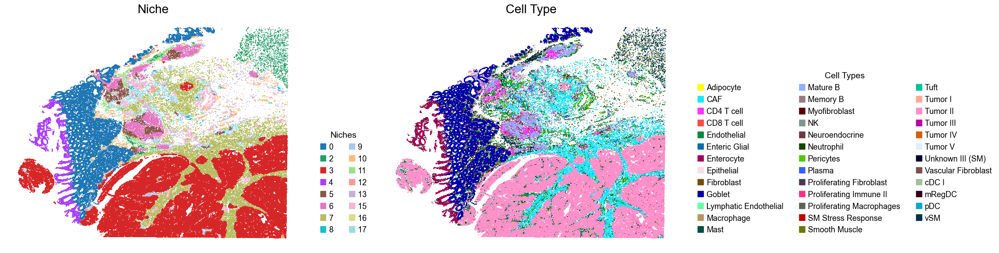

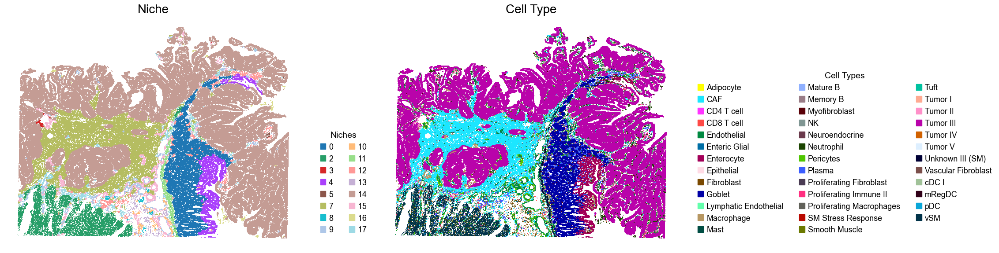

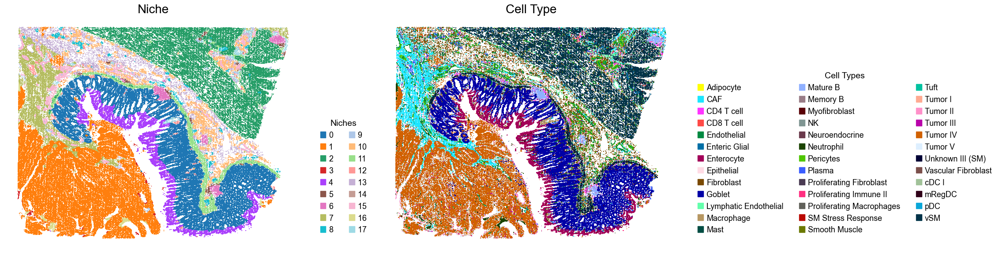

In [7]:
for i, slice_name in enumerate(slice_name_list):
    adata = adata_concat[adata_concat.obs['slice_name'] == slice_name, :].copy()

    fig, axes = plt.subplots(1, 2, figsize=(23, 6))

    sc.pl.embedding(adata, basis='spatial', palette=niche_color_dict,
                    color='niche_label', ax=axes[0], frameon=False, marker='s', size=1, show=False)
    axes[0].set_title('Niche', fontsize=20)

    handles = [
        mpatches.Patch(color=color, label=niche)
        for niche, color in zip(niches, niche_colors) if niche in sorted(adata.obs['niche_label'].unique())
    ]
    axes[0].legend(handles=handles, title='Niches', loc=(1.05, 0.05), frameon=False, handleheight=0.8, handlelength=0.7, ncol=2)
    
    sc.pl.embedding(adata, basis='spatial', palette=ct_color_dict, 
                    color='DeconvolutionLabel1', ax=axes[1], frameon=False, marker='s', size=1, show=False)
    axes[1].set_title('Cell Type', fontsize=20)

    handles = [
        mpatches.Patch(color=color, label=ct)
        for ct, color in zip(celltypes, ct_colors)
    ]
    axes[1].legend(handles=handles, title='Cell Types', loc=(1.05, 0.05), frameon=False, handleheight=0.8, handlelength=0.7, ncol=3)

    plt.tight_layout()
    plt.show()

#### Cell type composition

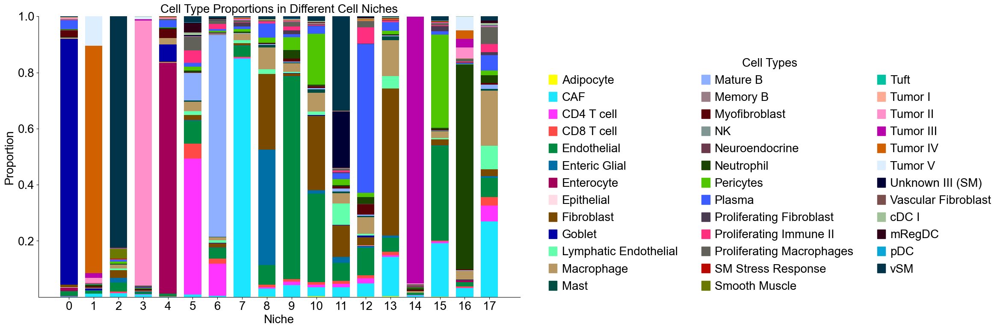

In [8]:
niche_labels = adata_concat_new.uns['niche_label_summary'].copy()
ct_labels = sorted(set(adata_concat_new.obs['DeconvolutionLabel1']))
niche_dist = adata_concat_new.uns['niche_dist'].toarray().copy()
cell_count_niche = adata_concat_new.uns['niche_cell_count'].copy()

fig, ax = plt.subplots(figsize=(24, 8))
bar_width = 0.7
n_niches, n_cell_types = niche_dist.shape

x = np.arange(n_niches)

for j in range(n_cell_types):
    bottom = np.sum(niche_dist[:, :j], axis=1)
    ax.bar(x,                         
           niche_dist[:, j],            
           bottom=bottom,               
           width=bar_width,
           color=ct_color_dict[ct_labels[j]],
           label=ct_labels[j])

ax.set_ylabel('Proportion', fontsize=20)
ax.set_xlabel('Niche', fontsize=20)
ax.set_xticks(x)
ax.set_xticklabels(niche_labels, rotation=0, ha='center')
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(False)

handles = [
    mpatches.Patch(color=color, label=ct)
    for ct, color in zip(celltypes, ct_colors)
]

ax.legend(handles=handles, title='Cell Types', loc=(1.05, 0.0), frameon=False, handleheight=0.8, 
          handlelength=0.7, ncol=3, fontsize=20, title_fontsize=20)

plt.title('Cell Type Proportions in Different Cell Niches', fontsize=20)
plt.tight_layout()
plt.show()

### Cell type enrichment analysis

In [30]:
ct_df = ct_enrichment_test(adata_concat_new.uns['niche_dist'], 
                           adata_concat_new.uns['niche_cell_count'], 
                           adata_concat_new.uns['idx2ct'],
                           adata_concat_new.uns['niche_label_summary'],
                           method='fisher', 
                           alpha=0.05, 
                           fdr_method='fdr_by', 
                           log2fc_threshold=1,
                           prop_threshold=0.01,
                           verbose=True,
                           )
ct_df.head()

18 niches and 38 cell types in total.



,niche_idx,niche,celltype_idx,celltype,oddsratio,p-value,q-value,log2fc,prop,enrichment
0,0,0,0,Adipocyte,0.156685,3.814045e-05,4.038765e-04,-2.673878,0.000023,False
1,0,0,1,CAF,0.004531,0.000000e+00,0.000000e+00,-7.602575,0.000617,False
2,0,0,2,CD4 T cell,0.175170,2.758371e-201,7.617551e-200,-2.504145,0.001333,False
3,0,0,3,CD8 T cell,0.139134,7.060848e-80,1.435934e-78,-2.842188,0.000366,False
4,0,0,4,Endothelial,0.420321,0.000000e+00,0.000000e+00,-1.215428,0.017811,False


Plot the results

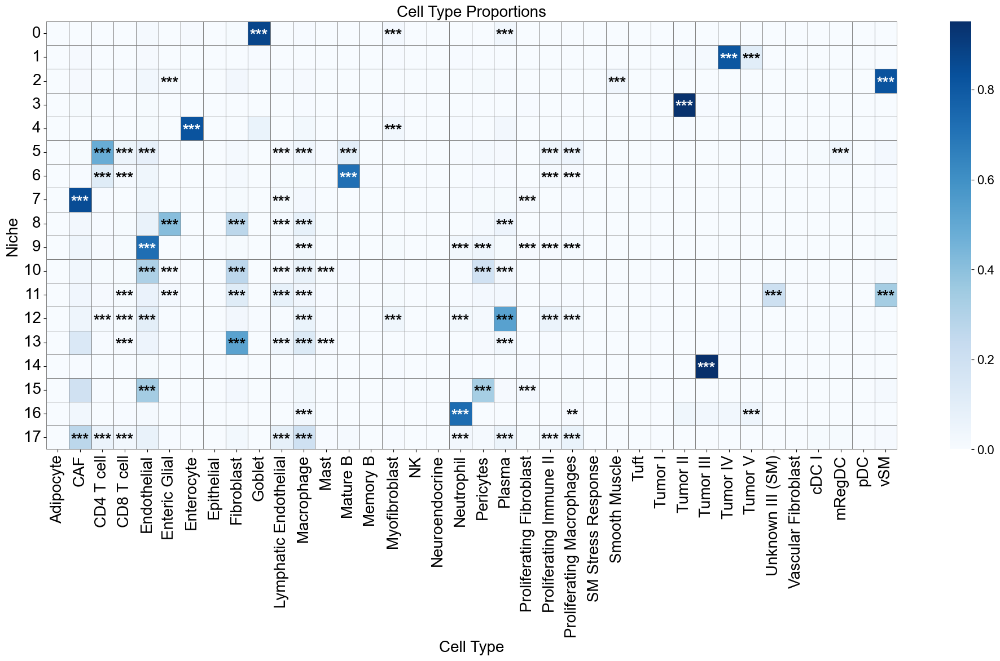

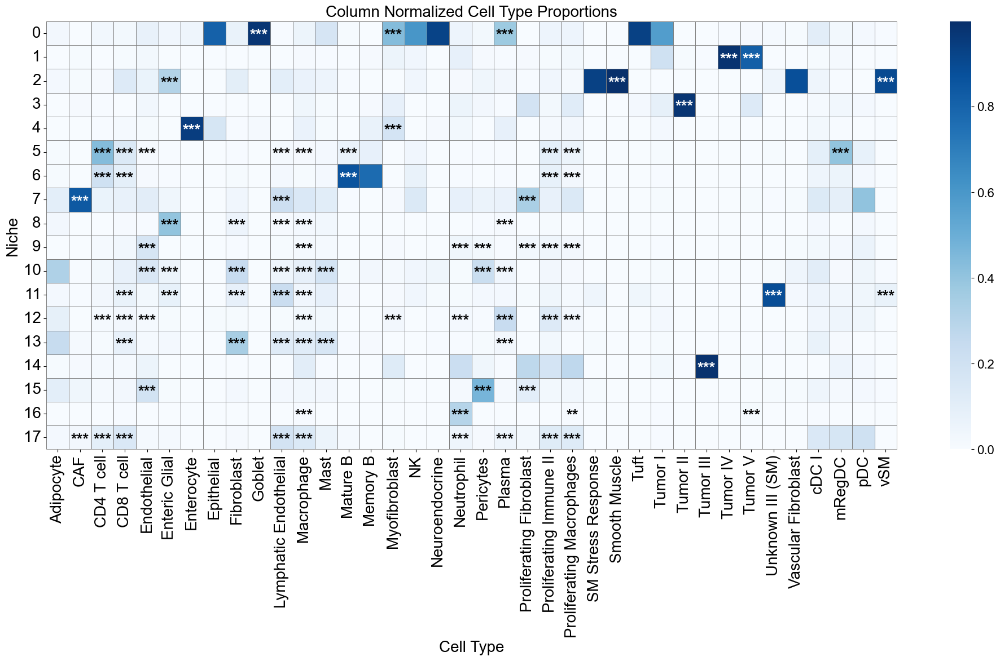

In [31]:
niche_labels = adata_concat_new.uns['niche_label_summary'].copy()
ct_labels = sorted(adata_concat_new.obs['DeconvolutionLabel1'].unique())

matrix_df = pd.DataFrame(
    data=adata_concat_new.uns['niche_dist'].toarray(),
    index=niche_labels,
    columns=ct_labels,
)

cn_dist_count = adata_concat_new.uns['niche_dist'].toarray() * adata_concat_new.uns['niche_cell_count'][:, np.newaxis]
cn_dist_norm = cn_dist_count / np.sum(cn_dist_count, axis=0)
matrix_df_norm = pd.DataFrame(
    data=cn_dist_norm,
    index=niche_labels,
    columns=ct_labels,
)

ct_df['stars'] = ct_df['q-value'].apply(p2stars)

stars_df = pd.DataFrame(
    '', 
    index=matrix_df.index, 
    columns=matrix_df.columns
)

for _, row in ct_df[ct_df['enrichment']].iterrows():
    niche = row['niche']
    ct    = row['celltype']
    if (niche in stars_df.index) and (ct in stars_df.columns):
        stars_df.loc[niche, ct] = row['stars']


fig, axes = plt.subplots(1, 1, figsize=(20, 12))

sns_heatmap_0 = sns.heatmap(
    matrix_df, 
    cmap='Blues', 
    # cbar_kws={'label': 'Cell type proportion'}, 
    linewidths=0.5,
    linecolor='gray',
    # square=True,
    ax=axes
)

for i, niche in enumerate(matrix_df.index):
    for j, ct in enumerate(matrix_df.columns):
        star = stars_df.iloc[i, j]
        if star:
            if matrix_df.iloc[i, j] > np.max(matrix_df.values) * 0.7:
                color='white'
            else:
                color='black'
            axes.text(j + 0.5, i + 0.6, star, ha='center', va='center', color=color, fontsize=20, fontweight='bold')

n_rows, n_cols = matrix_df.shape
axes.plot([0, n_cols], [n_rows, n_rows], color='gray', linewidth=0.5, clip_on=False) 
axes.plot([n_cols, n_cols], [0, n_rows], color='gray', linewidth=0.5, clip_on=False)  

axes.set_xticklabels(axes.get_xticklabels(), rotation=90, ha='center', fontsize=20)
axes.set_yticklabels(axes.get_yticklabels(), rotation=0, ha='right', fontsize=20)
axes.set_ylabel('Niche', fontsize=20)
axes.set_xlabel('Cell Type', fontsize=20)
axes.set_title('Cell Type Proportions', fontsize=20)
axes.collections[0].colorbar.ax.yaxis.label.set_size(20)
axes.collections[0].colorbar.ax.tick_params(labelsize=16)
axes.grid(False)

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 1, figsize=(20, 12))

sns_heatmap_1 = sns.heatmap(
    matrix_df_norm, 
    cmap='Blues', 
    # cbar_kws={'label': 'Cell type proportion'}, 
    linewidths=0.5,
    linecolor='gray',
    # square=True,
    ax=axes
)

for i, niche in enumerate(matrix_df.index):
    for j, ct in enumerate(matrix_df.columns):
        star = stars_df.iloc[i, j]
        if star:
            if matrix_df_norm.iloc[i, j] > np.max(matrix_df_norm.values) * 0.7:
                color='white'
            else:
                color='black'
            axes.text(j + 0.5, i + 0.6, star, ha='center', va='center', color=color, fontsize=20, fontweight='bold')

n_rows, n_cols = matrix_df.shape
axes.plot([0, n_cols], [n_rows, n_rows], color='gray', linewidth=0.5, clip_on=False) 
axes.plot([n_cols, n_cols], [0, n_rows], color='gray', linewidth=0.5, clip_on=False)  

axes.set_xticklabels(axes.get_xticklabels(), rotation=90, ha='center', fontsize=20)
axes.set_yticklabels(axes.get_yticklabels(), rotation=0, ha='right', fontsize=20)
axes.set_ylabel('Niche', fontsize=20)
axes.set_xlabel('Cell Type', fontsize=20)
axes.set_title('Column Normalized Cell Type Proportions', fontsize=20)
axes.collections[0].colorbar.ax.yaxis.label.set_size(20)
axes.collections[0].colorbar.ax.tick_params(labelsize=16)
axes.grid(False)

plt.tight_layout()
plt.show()

### Niche-niche co-localization analysis

In [11]:
nnc_results = nnc_enrichment_test(adata_list, 
                                  'niche_label', 
                                  niche_summary=adata_concat_new.uns['niche_label_summary'],  
                                  spatial_key='spatial', 
                                  cut_percentage=99, 
                                  method='fisher', 
                                  alpha=0.05, 
                                  fdr_method='fdr_by', 
                                  log2fc_threshold=1, 
                                  prop_threshold=0.01, 
                                  verbose=True,
                                  )
nnc_df, edge_prop_mtx, n1_count = nnc_results
nnc_df.head()

18 niches in total.



,niche1_idx,niche1,niche2_idx,niche2,edge_count,edge_prop,oddsratio,p-value,q-value,log2fc,enrichment
0,0,0,1,1,175.0,0.015345,0.685812,4.019238e-07,2.936091e-06,-0.534008,False
1,0,0,2,2,52.0,0.004560,0.104857,8.166059e-134,1.789615e-132,-3.198412,False
2,0,0,3,3,216.0,0.018941,0.459424,7.979776e-36,8.549641e-35,-1.090302,False
3,0,0,4,4,3896.0,0.341635,58.575680,0.000000e+00,0.000000e+00,5.281915,True
4,0,0,5,5,164.0,0.014381,0.557891,3.232540e-15,2.664144e-14,-0.825595,False


Plot the results

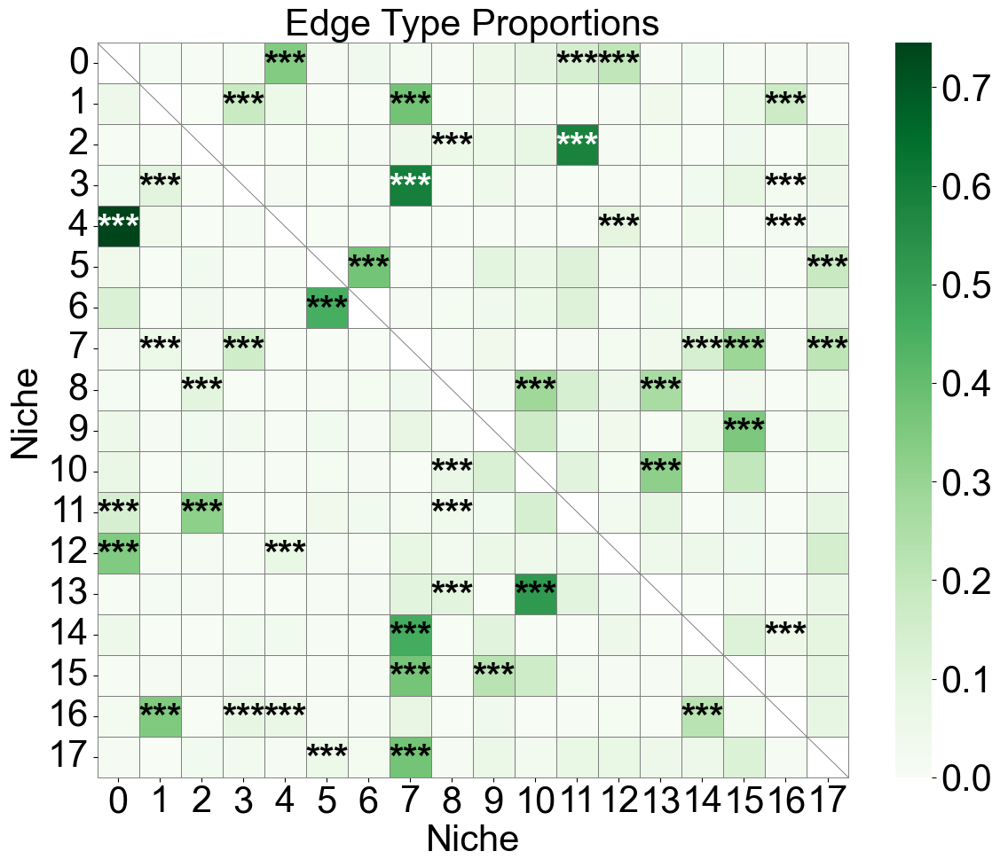

In [12]:
niche_labels = adata_concat_new.uns['niche_label_summary'].copy()

nnc_df['stars'] = nnc_df['q-value'].apply(p2stars)

matrix_df = pd.DataFrame(
    data=edge_prop_mtx,
    index=niche_labels,
    columns=niche_labels,
)

for i in range(matrix_df.shape[0]):
    for j in range(matrix_df.shape[1]):
        if i == j:
            matrix_df.iloc[i, j] = np.nan

stars_df = pd.DataFrame(
    '', 
    index=matrix_df.index, 
    columns=matrix_df.columns
)

for _, row in nnc_df[nnc_df['enrichment']].iterrows():
    n1 = row['niche1']
    n2 = row['niche2']
    if (n1 in stars_df.index) and (n2 in stars_df.columns):
        stars_df.loc[n1, n2] = row['stars']

plt.figure(figsize=(12, 10))

ax  = sns.heatmap(
    matrix_df, 
    cmap='Greens', 
    # cbar_kws={'label': 'Edge type proportion'}, 
    linewidths=0.7,
    linecolor='gray',
    # square=True,
)

for i, n1 in enumerate(matrix_df.index):
    for j, n2 in enumerate(matrix_df.columns):
        if i == j:
            ax.plot([i, i+1], [i, i+1], color='gray', linewidth=0.7)
            # ax.plot([i+1, i], [i, i+1], color='gray', linewidth=0.7)
            continue
        star = stars_df.iloc[i, j]
        if star:
            if matrix_df.iloc[i, j] > np.nanmax(matrix_df.values) * 0.7:
                color='white'
            else:
                color='black'
            ax.text(j + 0.5, i + 0.6, star, ha='center', va='center', color=color, fontsize=30, fontweight='bold')

n_rows, n_cols = matrix_df.shape
ax.plot([0, n_cols], [n_rows, n_rows], color='gray', linewidth=0.7, clip_on=False) 
ax.plot([n_cols, n_cols], [0, n_rows], color='gray', linewidth=0.7, clip_on=False)  

ax.set_xticklabels(ax.get_xticklabels(), rotation=0, ha='center', fontsize=30)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, ha='right', fontsize=30)
ax.set_ylabel('Niche', fontsize=30)
ax.set_xlabel('Niche', fontsize=30)
ax.set_title('Edge Type Proportions', fontsize=30)
ax.collections[0].colorbar.ax.yaxis.label.set_size(30)
ax.collections[0].colorbar.ax.tick_params(labelsize=30)
ax.grid(False)

plt.tight_layout()
plt.show()

### Niche-niche co-localization analysis for individual slice

16 niches in total.



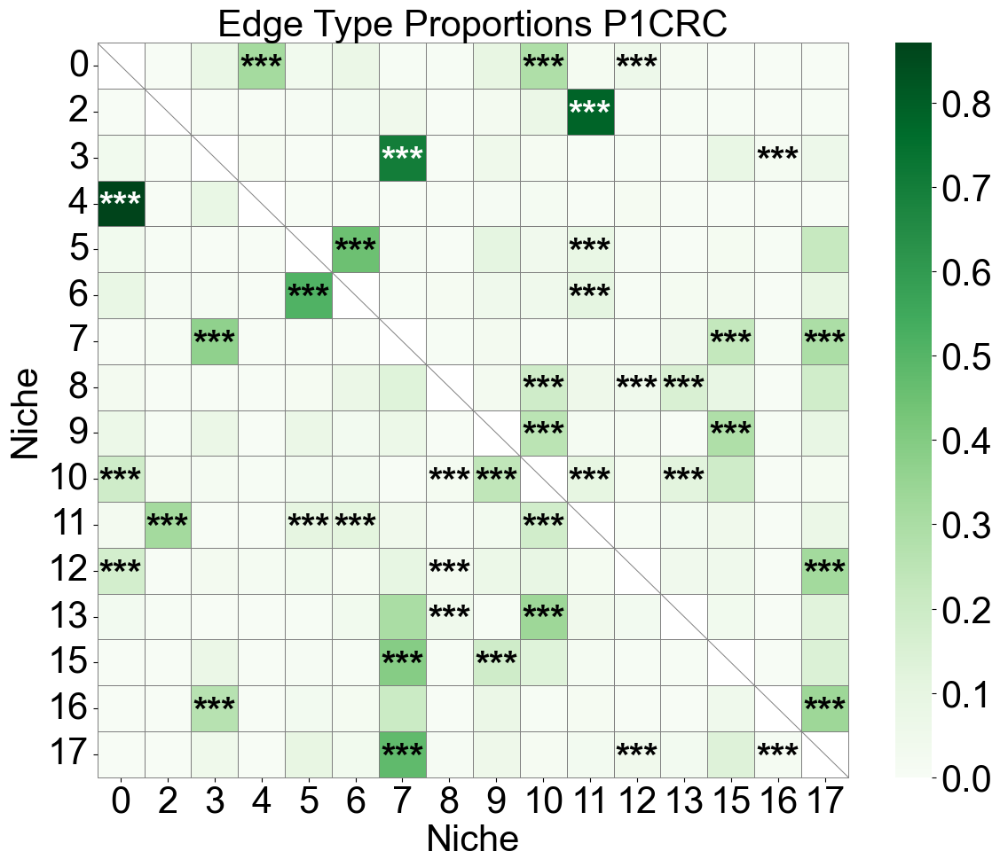

16 niches in total.



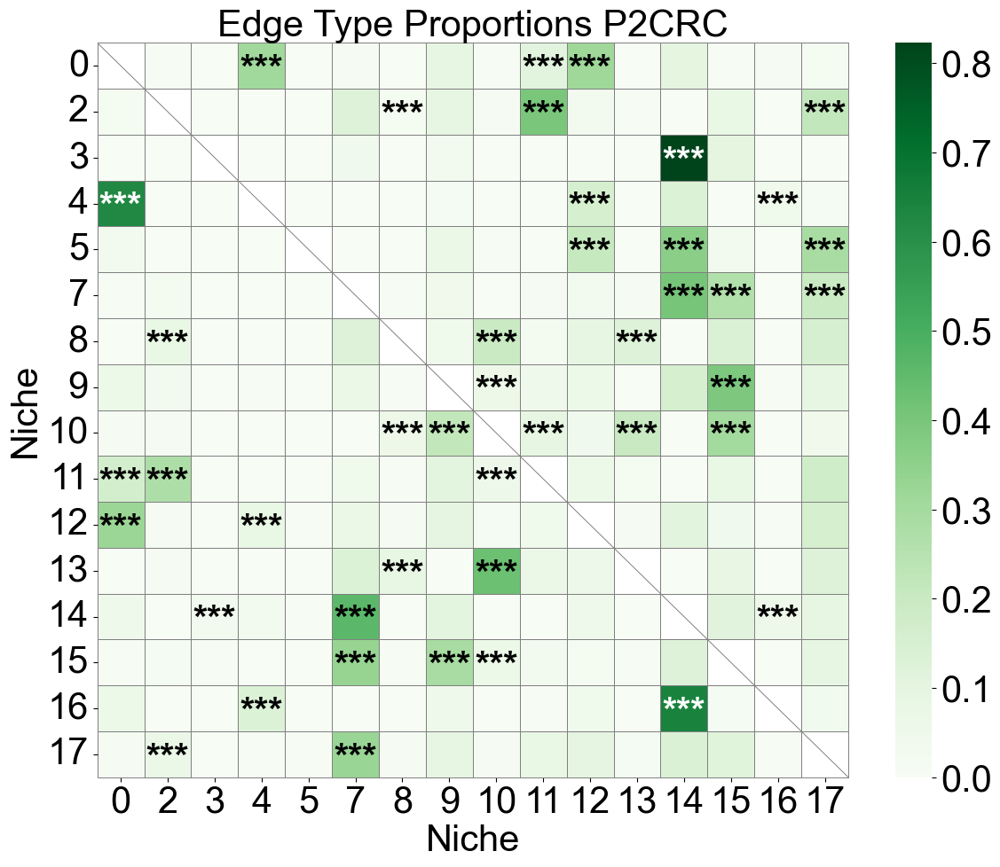

18 niches in total.



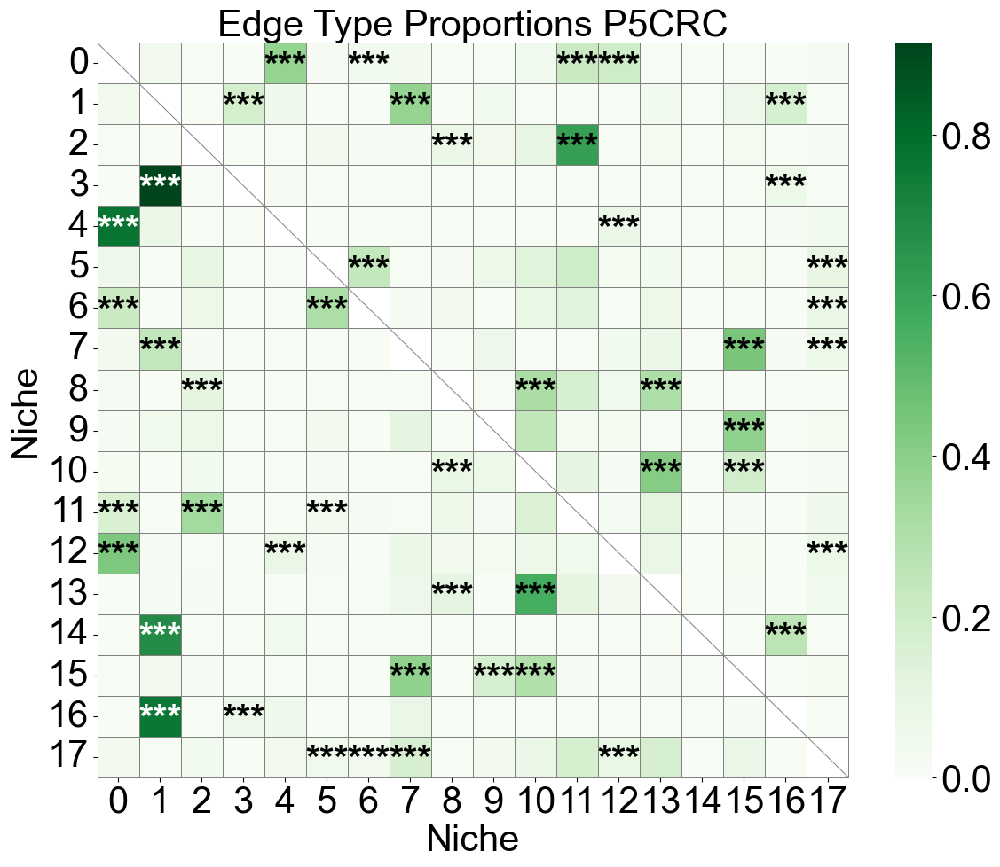

In [13]:
for s, slice_name in enumerate(slice_name_list):
    current_sum = adata_list[s].obs['niche_label'].unique()
    niche_labels = [label for label in adata_concat_new.uns['niche_label_summary'] if label in current_sum]
    nnc_results = nnc_enrichment_test(adata_list[s], 
                                    'niche_label', 
                                    niche_summary=niche_labels,  
                                    spatial_key='spatial', 
                                    cut_percentage=99, 
                                    method='fisher', 
                                    alpha=0.05, 
                                    fdr_method='fdr_by', 
                                    log2fc_threshold=1, 
                                    prop_threshold=0.01,
                                    verbose=True,
                                    )
    nnc_df, edge_prop_mtx, n1_count = nnc_results

    nnc_df['stars'] = nnc_df['q-value'].apply(p2stars)

    matrix_df = pd.DataFrame(
        data=edge_prop_mtx,
        index=niche_labels,
        columns=niche_labels,
    )

    for i in range(matrix_df.shape[0]):
        for j in range(matrix_df.shape[1]):
            if i == j:
                matrix_df.iloc[i, j] = np.nan

    stars_df = pd.DataFrame(
        '', 
        index=matrix_df.index, 
        columns=matrix_df.columns
    )

    for _, row in nnc_df[nnc_df['enrichment']].iterrows():
        n1 = row['niche1']
        n2 = row['niche2']
        if (n1 in stars_df.index) and (n2 in stars_df.columns):
            stars_df.loc[n1, n2] = row['stars']

    plt.figure(figsize=(12, 10))

    ax  = sns.heatmap(
        matrix_df, 
        cmap='Greens', 
        # cbar_kws={'label': 'Edge type proportion'}, 
        linewidths=0.7,
        linecolor='gray',
        # square=True,
    )

    for i, n1 in enumerate(matrix_df.index):
        for j, n2 in enumerate(matrix_df.columns):
            if i == j:
                ax.plot([i, i+1], [i, i+1], color='gray', linewidth=0.7)
                # ax.plot([i+1, i], [i, i+1], color='gray', linewidth=0.7)
                continue
            star = stars_df.iloc[i, j]
            if star:
                if matrix_df.iloc[i, j] > np.nanmax(matrix_df.values) * 0.7:
                    color='white'
                else:
                    color='black'
                ax.text(j + 0.5, i + 0.6, star, ha='center', va='center', color=color, fontsize=30, fontweight='bold')

    n_rows, n_cols = matrix_df.shape
    ax.plot([0, n_cols], [n_rows, n_rows], color='gray', linewidth=0.7, clip_on=False) 
    ax.plot([n_cols, n_cols], [0, n_rows], color='gray', linewidth=0.7, clip_on=False)  

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, ha='center', fontsize=30)
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, ha='right', fontsize=30)
    ax.set_ylabel('Niche', fontsize=30)
    ax.set_xlabel('Niche', fontsize=30)
    ax.set_title(f'Edge Type Proportions {slice_name}', fontsize=30)
    ax.collections[0].colorbar.ax.yaxis.label.set_size(30)
    ax.collections[0].colorbar.ax.tick_params(labelsize=30)
    ax.grid(False)

    plt.tight_layout()
    plt.show()

### Cell-cell interaction analysis

In [32]:
cci_results = cci_enrichment_test(adata_list, 
                                  'niche_label', 
                                  'DeconvolutionLabel1', 
                                  niche_summary=adata_concat_new.uns['niche_label_summary'], 
                                  spatial_key='spatial', 
                                  cut_percentage=99,
                                  method='fisher', 
                                  alpha=0.05, 
                                  fdr_method='fdr_by', 
                                  log2fc_threshold=1, 
                                  prop_threshold=0.01,
                                  verbose=True,
                                  )
cci_df, test_norm_list, bg_norm_list, test_edge_count_list, bg_edge_count_list = cci_results

18 niches and 38 cell types in total.

Testing niche 0...
Testing niche 1...
Testing niche 2...
Testing niche 3...
Testing niche 4...
Testing niche 5...
Testing niche 6...
Testing niche 7...
Testing niche 8...
Testing niche 9...
Testing niche 10...
Testing niche 11...
Testing niche 12...
Testing niche 13...
Testing niche 14...
Testing niche 15...
Testing niche 16...
Testing niche 17...
Finished!


Plot the results

In [33]:
niche_labels = adata_concat_new.uns['niche_label_summary'].copy()
ct_labels = sorted(adata_concat_new.obs['DeconvolutionLabel1'].unique())

cci_df['stars'] = cci_df['q-value'].apply(p2stars)

figrows = 18
figcols = 1

fig, axes = plt.subplots(figrows, figcols, figsize=(18, 300))

for idx in range(figrows * figcols):

    imgrow = idx // figcols
    imgcol = idx % figcols

    if figcols == 1 and figrows == 1:
        ax = axes    
    elif figrows == 1:
        ax = axes[imgcol] 
    elif figcols == 1:
        ax = axes[imgrow]  
    else:
        ax = axes[imgrow, imgcol]   

    if idx >= len(niche_labels):
        ax.axis('off')
        continue

    sub_df = cci_df[cci_df['niche_idx'] == idx]

    matrix_df = pd.DataFrame(
        data=test_norm_list[idx],
        index=ct_labels,
        columns=ct_labels,
    )

    for i in range(matrix_df.shape[0]):
        for j in range(matrix_df.shape[1]):
            if i < j:
                matrix_df.iloc[i, j] = np.nan

    stars_df = pd.DataFrame(
        '', 
        index=matrix_df.index, 
        columns=matrix_df.columns
    )

    for _, row in sub_df[sub_df['enrichment']].iterrows():
        ct1 = row['ct1']
        ct2 = row['ct2']
        if (ct1 in stars_df.index) and (ct2 in stars_df.columns):
            stars_df.loc[ct1, ct2] = row['stars']

    sns_heatmap = sns.heatmap(
        matrix_df, 
        cmap='Oranges', 
        mask=matrix_df.isna(),
        # cbar_kws={'label': 'Edge type proportion'}, 
        # linewidths=0.5,
        # linecolor='gray',
        # square=True,
        ax=ax,
    )

    n_rows, n_cols = matrix_df.shape

    for i, ct1 in enumerate(matrix_df.index):
        ax.plot([0, i+1], [i, i], color='gray', linewidth=0.5, clip_on=False) 
        ax.plot([i+1, i+1], [i, n_rows], color='gray', linewidth=0.5, clip_on=False)
        for j, ct2 in enumerate(matrix_df.columns):
            star = stars_df.iloc[i, j]
            if star:
                if matrix_df.iloc[i, j] > np.nanmax(matrix_df.values) * 0.7:
                    color='white'
                else:
                    color='black'
                ax.text(j + 0.5, i + 0.6, star, ha='center', va='center', color=color, fontsize=20, fontweight='bold')
    
    ax.plot([0, 0], [0, n_rows], color='gray', linewidth=0.5, clip_on=False) 
    ax.plot([0, n_cols], [n_rows, n_rows], color='gray', linewidth=0.5, clip_on=False)  
    # ax.plot([0, n_cols], [n_rows, n_rows], color='gray', linewidth=0.5, clip_on=False) 
    # ax.plot([n_cols, n_cols], [0, n_rows], color='gray', linewidth=0.5, clip_on=False)  

    ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='center', fontsize=20)
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, ha='right', fontsize=20)
    ax.set_ylabel('Cell Type', fontsize=20)
    ax.set_xlabel('Cell Type', fontsize=20)
    ax.set_title(f'Niche {niche_labels[idx]}', fontsize=20)
    ax.collections[0].colorbar.ax.yaxis.label.set_size(20)
    ax.collections[0].colorbar.ax.tick_params(labelsize=16)
    ax.grid(False)

plt.tight_layout()
plt.show()

### Macrophages (near tumor vs far from tumor)
We highlight macrophages and proliferating macrophages within the niches of interest (near tumor) compared to those located in other niches (far from tumor).  

The first panel shows the selected niches of interest.  
The second panel displays the spatial distribution of the macrophage populations within these niches.  
The third panel shows the same macrophage populations outside the niches of interest, allowing direct visual comparison.  

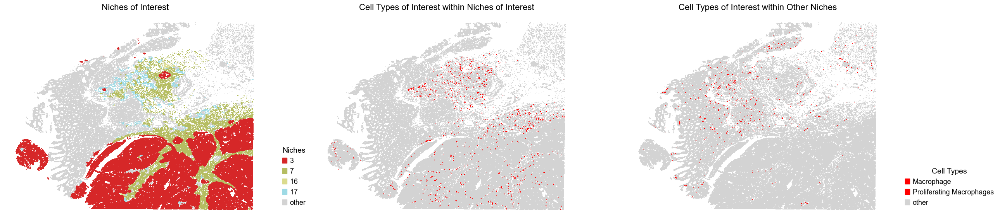

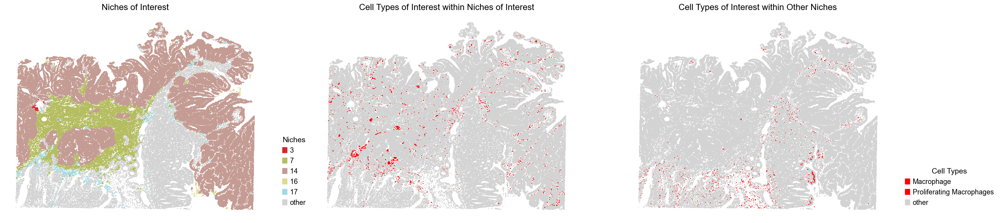

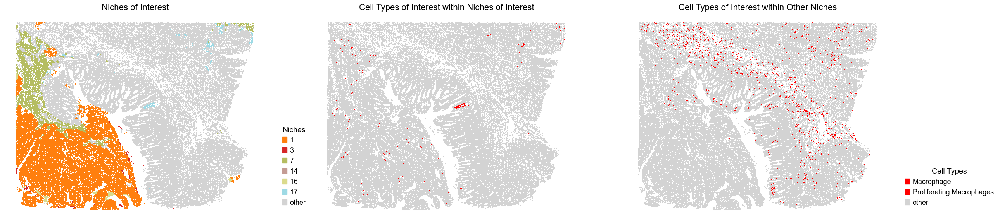

In [143]:
ctoi_list = ['Macrophage', 'Proliferating Macrophages']
noi_list = ['1', '3', '14', '7', '16', '17']
# noi_list1 = ['1', '3', '14']
# noi_list2 = ['7', '16', '17']

niche_color_dict.update({'other': 'lightgray'})
ctoi_color_dict = {ct: 'red' for ct in ctoi_list}
ctoi_color_dict.update({'other': 'lightgray'})

for i in range(len(slice_name_list)):

    adata_list[i].obs['noi'] = [label if label in noi_list else 'other' for label in adata_list[i].obs['niche_label']]
    adata_list[i].obs['ctoi'] = [label if ((label in ctoi_list) & (adata_list[i].obs['noi'][idx] != 'other')) else 'other' 
                                 for idx, label in enumerate(adata_list[i].obs['DeconvolutionLabel1'])]
    adata_list[i].obs['ctoi_other'] = [label if ((label in ctoi_list) & (adata_list[i].obs['noi'][idx] == 'other')) else 'other' 
                                 for idx, label in enumerate(adata_list[i].obs['DeconvolutionLabel1'])]

    fig, axes = plt.subplots(1, 3, figsize=(26, 6))

    sc.pl.embedding(adata_list[i], basis='spatial', palette=niche_color_dict,
                    color='noi', ax=axes[0], frameon=False, marker='s', size=1, show=False)
    axes[0].set_title('Niches of Interest', fontsize=16)   
    handles = [
        mpatches.Patch(color=color, label=niche)
        for niche, color in zip(niche_color_dict.keys(), niche_color_dict.values()) if niche in sorted(adata_list[i].obs['noi'].unique())
    ]
    axes[0].legend(handles=handles, title='Niches', loc=(1.05, 0.05), frameon=False, handleheight=0.8, handlelength=0.7, ncol=1)
    
    sc.pl.embedding(adata_list[i], basis='spatial', palette=ctoi_color_dict, 
                    color='ctoi', ax=axes[1], frameon=False, marker='s', size=1, show=False, legend_loc=None)
    axes[1].set_title('Cell Types of Interest within Niches of Interest', fontsize=16)
    # handles = [
    #     mpatches.Patch(color=color, label=niche)
    #     for niche, color in zip(ctoi_color_dict.keys(), ctoi_color_dict.values())
    # ]
    # axes[1].legend(handles=handles, title='Cell Types', loc=(1.05, 0.05), frameon=False, handleheight=0.8, handlelength=0.7, ncol=1)
    
    sc.pl.embedding(adata_list[i], basis='spatial', palette=ctoi_color_dict, 
                    color='ctoi_other', ax=axes[2], frameon=False, marker='s', size=1, show=False)
    axes[2].set_title('Cell Types of Interest within Other Niches', fontsize=16)   
    handles = [
        mpatches.Patch(color=color, label=niche)
        for niche, color in zip(ctoi_color_dict.keys(), ctoi_color_dict.values())
    ]
    axes[2].legend(handles=handles, title='Cell Types', loc=(1.05, 0.05), frameon=False, handleheight=0.8, handlelength=0.7, ncol=1)
    
    plt.tight_layout()
    plt.show()

#### Differential expression analysis of macrophages
For each slice, we extract macrophages of interest within the selected niches and those located in other niches.  
The two groups are concatenated and genes expressed in fewer than 200 cells are filtered out.  
Significant markers are selected based on adjusted p-values (< 0.01) and log fold change (> 0.2)

In [144]:
qvals_thres = 0.01
logfc_thres = 0.2
df_list = [[] for _ in range(len(adata_list))]
adata_oi_list = []
volcano_list = []
for i in range(len(adata_list)):

    # sc.pp.filter_genes(adata_list[i], min_cells=10)
    # print(f'{adata_list[i].shape[0]} genes left for {slice_name_list[i]}.')
    # sc.pp.normalize_total(adata_list[i], target_sum=1e4)
    # sc.pp.log1p(adata_list[i])

    # adata_oi = adata_list[i][(adata_list[i].obs['ctoi'] != 'other') & (adata_list[i].obs['niche_label'].isin(noi_list1)), :].copy()
    # adata_oi2 = adata_list[i][(adata_list[i].obs['ctoi'] != 'other') & (adata_list[i].obs['niche_label'].isin(noi_list2)), :].copy()
    adata_oi = adata_list[i][(adata_list[i].obs['ctoi'] != 'other') & (adata_list[i].obs['noi'] != 'other'), :].copy()
    adata_others = adata_list[i][(adata_list[i].obs['ctoi_other'] != 'other') & (adata_list[i].obs['noi'] == 'other'), :].copy()
    print(adata_oi.shape, adata_others.shape)
    print((adata_oi.shape[0] + adata_others.shape[0]) / adata_list[i].shape[0])
    
    adata_oi_concat = ad.concat([adata_oi, adata_others], label='oi_group', keys=['oi', 'other'])
    
    sc.pp.filter_genes(adata_oi_concat, min_cells=200)
    # sc.pp.highly_variable_genes(adata_oi_concat, n_top_genes=3000, flavor='seurat_v3')
    # adata_oi_concat = adata_oi_concat[:, adata_oi_concat.var['highly_variable']].copy()
    print(adata_oi_concat.shape)

    sc.tl.rank_genes_groups(adata_oi_concat, groupby='oi_group', method='wilcoxon')

    for group in ['oi', 'other']:
        df = sc.get.rank_genes_groups_df(adata_oi_concat, group=group)
        df_filtered = df[(df['pvals_adj'] < qvals_thres) & (df['logfoldchanges'] > logfc_thres)].copy()
        df_filtered = df_filtered.sort_values('logfoldchanges', ascending=False)
        df_filtered = df_filtered.rename(columns={
            'names': 'gene',
            'pvals': 'pval',
            'pvals_adj': 'pval_adj',
            'logfoldchanges': 'logfoldchange'
        })[['gene', 'pval', 'pval_adj', 'logfoldchange']]
        df_list[i].append(df_filtered)
        print(df_filtered.shape)

        if group == 'oi':
            volcano_list.append(df)
    
    adata_oi_list.append(adata_oi_concat) 

(3079, 18074) (1558, 18074)
0.019687513267948882
(4637, 510)
(29, 4)
(6, 4)
(4357, 18074) (2063, 18074)
0.019917661257046415
(6420, 2156)
(83, 4)
(24, 4)
(856, 18074) (4238, 18074)
0.0201948922066904
(5094, 1024)
(81, 4)
(11, 4)


Generate volcano plots for each slice, highlighting significant genes and annotating selected markers of interest.

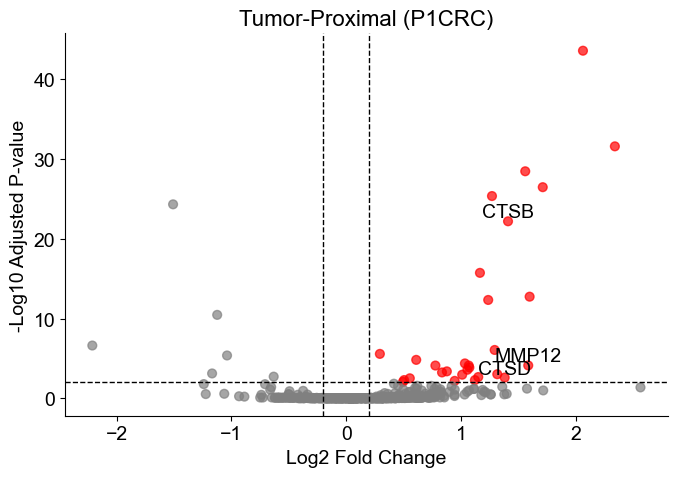

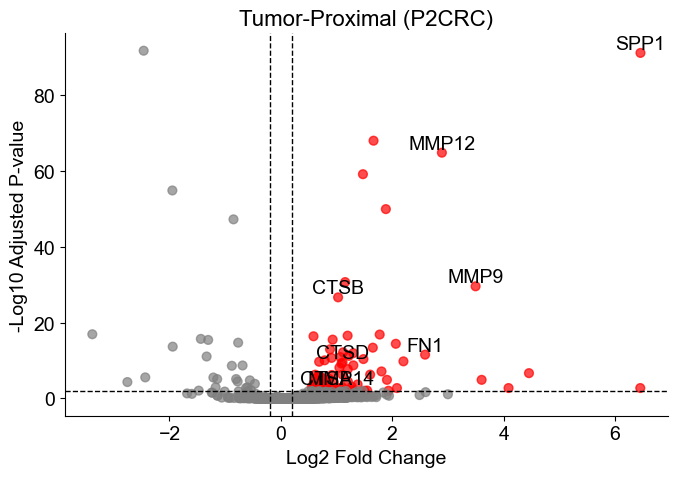

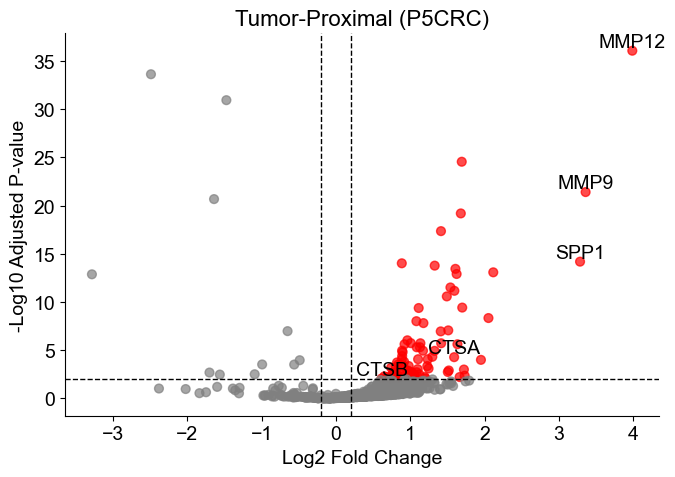

In [145]:
gene_list = ['IL4R', 'CCL4', 'CCL13', 'CCL20', 'CCL17', 'CCL18', 'CCL22', 'CCL24',
             'LYVE1', 'VEGFA', 'VEGFB', 'VEGFC', 'VEGFD', 'EGF', 'CTSA', 'CTSB', 
             'CTSC', 'CTSD', 'TGFB1', 'TGFB2', 'TGFB3', 'MMP14', 'MMP19', 'MMP9', 
             'CLEC7A', 'WNT7B', 'FASL', 'TNFSF12', 'TNFSF8', 'CD276', 'VTCN1',
             'MSR1', 'FN1', 'IRF4', 'MMP12', 'SPP1']

for i in range(len(volcano_list)):
    df_volcano = volcano_list[i].copy()

    df_volcano['-log10(pval_adj)'] = -np.log10(df_volcano['pvals_adj'] + 1e-100)
    df_volcano['significant'] = (df_volcano['pvals_adj'] < qvals_thres) & (df_volcano['logfoldchanges'] > logfc_thres)

    plt.figure(figsize=(7, 5))
    plt.scatter(df_volcano['logfoldchanges'], df_volcano['-log10(pval_adj)'], 
                c=df_volcano['significant'].map({True: 'red', False: 'gray'}), 
                s=40, alpha=0.7)

    genes_to_annotate = df_volcano[
        df_volcano['significant'] & df_volcano['names'].isin(gene_list)
    ]
    for _, row in genes_to_annotate.iterrows():
        plt.text(row['logfoldchanges'], row['-log10(pval_adj)'], row['names'],
                 fontsize=14, ha='center', va='bottom')

    plt.axhline(-np.log10(qvals_thres), linestyle='--', color='black', lw=1)
    plt.axvline(logfc_thres, linestyle='--', color='black', lw=1)
    plt.axvline(-logfc_thres, linestyle='--', color='black', lw=1)

    plt.xlabel('Log2 Fold Change', fontsize=14)
    plt.ylabel('-Log10 Adjusted P-value', fontsize=14)
    plt.title(f'Tumor-Proximal ({slice_name_list[i]})', fontsize=16)

    ax = plt.gca()
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    plt.grid(False)
    plt.tight_layout()
    # plt.savefig(result_dir+f'volcano_{slice_name_list[i]}.pdf')
    plt.show()

In [ ]:
# # from 2021 cell pan tim paper
# m1_genes1 = ['IL23', 'TNF', 'CXCL9', 'CXCL10', 'CXCL11', 'CD86', 'IL1A', 'IL1B',
#              'IL6', 'CCL5', 'IRF5', 'IRF1', 'CD40', 'ID01', 'KYNU', 'CCR7']
# m2_genes1 = ['IL4R', 'CCL4', 'CCL13', 'CCL20', 'CCL17', 'CCL18', 'CCL22', 'CCL24',
#              'LYVE1', 'VEGFA', 'VEGFB', 'VEGFC', 'VEGFD', 'EGF', 'CTSA', 'CTSB', 
#              'CTSC', 'CTSD', 'TGFB1', 'TGFB2', 'TGFB3', 'MMP14', 'MMP19', 'MMP9', 
#              'CLEC7A', 'WNT7B', 'FASL', 'TNFSF12', 'TNFSF8', 'CD276', 'VTCN1',
#              'MSR1', 'FN1', 'IRF4']

### Spatial expression of some marker genes

#### Load Xenium data

Normalize the Xenium data

In [24]:
adata_list_Xenium = []
for slice_name in slice_name_list:
    adata = ad.read_h5ad(data_dir+f'{slice_name}_Xenium.h5ad')
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    adata_list_Xenium.append(adata)

One ROI from P1CRC

The four panels show niches of interest, cell types, and marker expression in Visium HD and Xenium data.

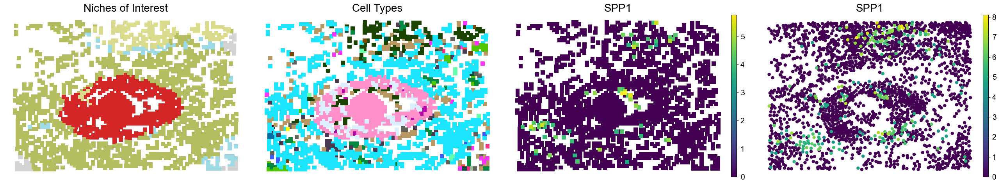

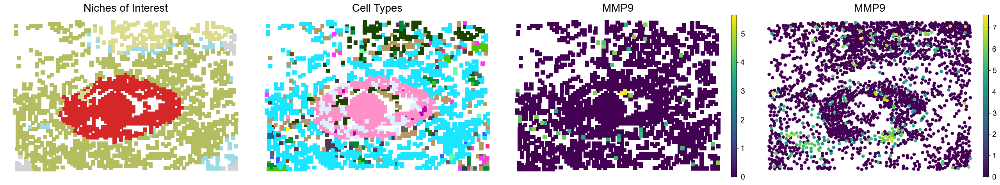

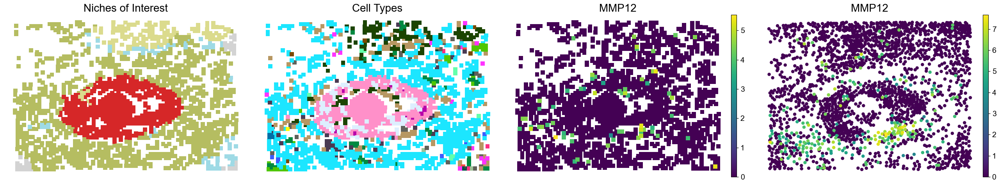

In [25]:
marker_list = ['SPP1', 'MMP9', 'MMP12']
slice_idx = 0

x_min, x_max = 122, 140
y_min, y_max = -180, -162
spatial = adata_list[slice_idx].obsm['spatial']
mask = (spatial[:, 0] >= x_min) & (spatial[:, 0] <= x_max) & (spatial[:, 1] >= y_min) & (spatial[:, 1] <= y_max)
adata = adata_list[slice_idx][mask].copy()

x_min, x_max = -3150, -2640
y_min, y_max = -1730, -1170
spatial = adata_list_Xenium[slice_idx].obsm['spatial']
mask = (spatial[:, 0] >= x_min) & (spatial[:, 0] <= x_max) & (spatial[:, 1] >= y_min) & (spatial[:, 1] <= y_max)
adatax = adata_list_Xenium[slice_idx][mask].copy()

for marker in marker_list:

    fig, axes = plt.subplots(1, 4, figsize=(26, 5))

    sc.pl.embedding(adata, basis='spatial', palette=niche_color_dict, 
                    color='noi', ax=axes[0], frameon=False, marker='s', size=60, show=False, legend_loc=None)
    axes[0].set_title('Niches of Interest', fontsize=20)

    sc.pl.embedding(adata, basis='spatial', palette=ct_color_dict,
                    color='DeconvolutionLabel1', ax=axes[1], frameon=False, marker='s', size=60, show=False, legend_loc=None)
    axes[1].set_title('Cell Types', fontsize=20)

    sc.pl.embedding(adata, basis='spatial', palette='viridis', 
                    color=marker, ax=axes[2], frameon=False, marker='s', size=60, show=False)
    axes[2].set_title(marker, fontsize=20)

    sc.pl.embedding(adatax, basis='spatial', palette='viridis', 
                    color=marker, ax=axes[3], frameon=False, size=150, show=False)
    axes[3].set_title(marker, fontsize=20)

    plt.tight_layout()
    plt.show()

One ROI from P2CRC

The four panels show niches of interest, cell types, and marker expression in Visium HD and Xenium data.

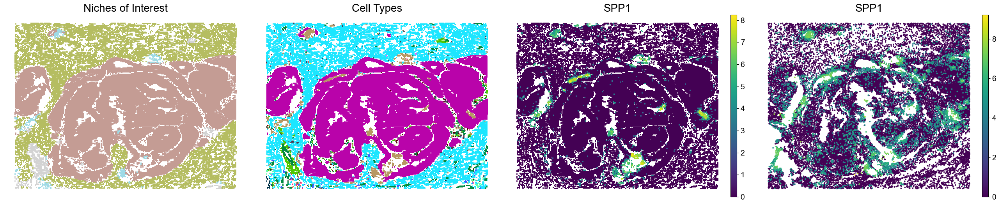

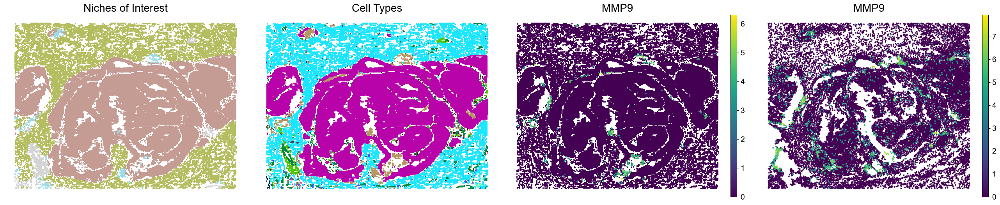

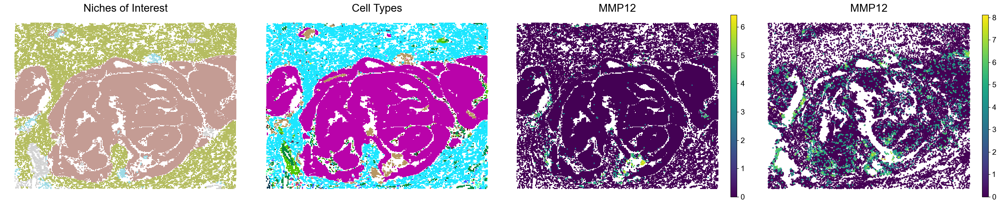

In [26]:
marker_list = ['SPP1', 'MMP9', 'MMP12']
slice_idx = 1

x_min, x_max = 350, 400
y_min, y_max = -140, -90
spatial = adata_list[slice_idx].obsm['spatial']
mask = (spatial[:, 0] >= x_min) & (spatial[:, 0] <= x_max) & (spatial[:, 1] >= y_min) & (spatial[:, 1] <= y_max)
adata = adata_list[slice_idx][mask].copy()

x_min, x_max = -6150, -4400
y_min, y_max = -4900, -3100
spatial = adata_list_Xenium[slice_idx].obsm['spatial']
mask = (spatial[:, 0] >= x_min) & (spatial[:, 0] <= x_max) & (spatial[:, 1] >= y_min) & (spatial[:, 1] <= y_max)
adatax = adata_list_Xenium[slice_idx][mask].copy()

for marker in marker_list:

    fig, axes = plt.subplots(1, 4, figsize=(26, 5.5))

    sc.pl.embedding(adata, basis='spatial', palette=niche_color_dict, 
                    color='noi', ax=axes[0], frameon=False, marker='s', size=5, show=False, legend_loc=None)
    axes[0].set_title('Niches of Interest', fontsize=20)

    sc.pl.embedding(adata, basis='spatial', palette=ct_color_dict,
                    color='DeconvolutionLabel1', ax=axes[1], frameon=False, marker='s', size=5, show=False, legend_loc=None)
    axes[1].set_title('Cell Types', fontsize=20)

    sc.pl.embedding(adata, basis='spatial', palette='viridis', 
                    color=marker, ax=axes[2], frameon=False, marker='s', size=5, show=False)
    axes[2].set_title(marker, fontsize=20)

    sc.pl.embedding(adatax, basis='spatial', palette='viridis', 
                    color=marker, ax=axes[3], frameon=False, size=30, show=False)
    axes[3].set_title(marker, fontsize=20)

    plt.tight_layout()
    plt.show()

One ROI from P5CRC

The four panels show niches of interest, cell types, and marker expression in Visium HD and Xenium data.

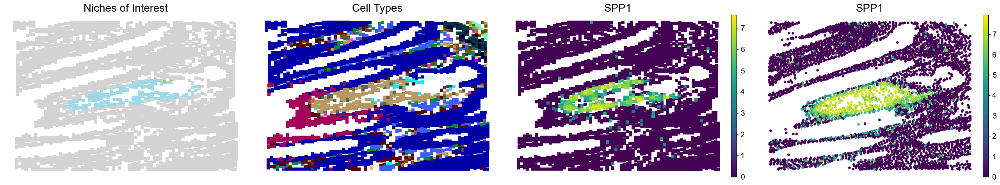

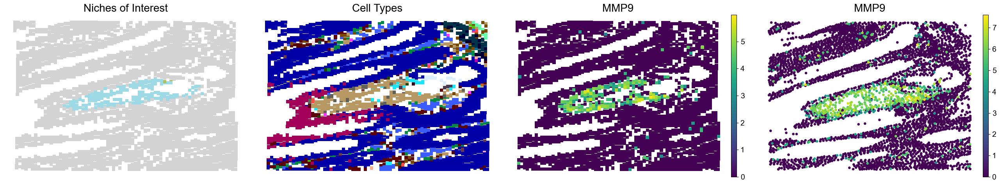

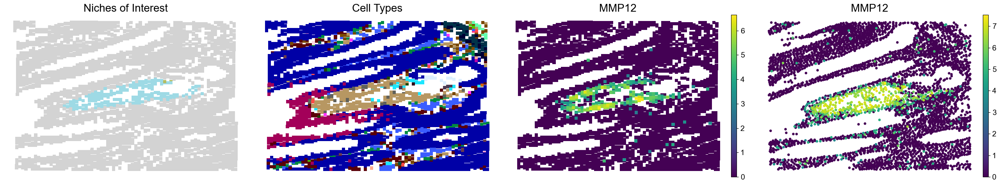

In [27]:
marker_list = ['SPP1', 'MMP9', 'MMP12']
slice_idx = 2

x_min, x_max = 453, 470
y_min, y_max = -430, -400
spatial = adata_list[slice_idx].obsm['spatial']
mask = (spatial[:, 0] >= x_min) & (spatial[:, 0] <= x_max) & (spatial[:, 1] >= y_min) & (spatial[:, 1] <= y_max)
adata = adata_list[slice_idx][mask].copy()

x_min, x_max = -3080, -2500
y_min, y_max = -3700, -2650
spatial = adata_list_Xenium[slice_idx].obsm['spatial']
mask = (spatial[:, 0] >= x_min) & (spatial[:, 0] <= x_max) & (spatial[:, 1] >= y_min) & (spatial[:, 1] <= y_max)
adatax = adata_list_Xenium[slice_idx][mask].copy()

for marker in marker_list:

    fig, axes = plt.subplots(1, 4, figsize=(26, 5))

    sc.pl.embedding(adata, basis='spatial', palette=niche_color_dict, 
                    color='noi', ax=axes[0], frameon=False, marker='s', size=35, show=False, legend_loc=None)
    axes[0].set_title('Niches of Interest', fontsize=20)

    sc.pl.embedding(adata, basis='spatial', palette=ct_color_dict,
                    color='DeconvolutionLabel1', ax=axes[1], frameon=False, marker='s', size=35, show=False, legend_loc=None)
    axes[1].set_title('Cell Types', fontsize=20)

    sc.pl.embedding(adata, basis='spatial', palette='viridis', 
                    color=marker, ax=axes[2], frameon=False, marker='s', size=35, show=False)
    axes[2].set_title(marker, fontsize=20)

    sc.pl.embedding(adatax, basis='spatial', palette='viridis', 
                    color=marker, ax=axes[3], frameon=False, size=90, show=False)
    axes[3].set_title(marker, fontsize=20)

    plt.tight_layout()
    plt.show()